<a href="https://colab.research.google.com/github/burhanikatimba/cyberlabs/blob/main/topicModeling.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

lets load the dataset

In [2]:
import pandas as pd
import numpy as np

path = "/content/drive/MyDrive/dataset/abcnews.csv"
df = pd.read_csv(path)

df.head()

,publish_date,headline_text
0,20030219,aba decides against community broadcasting lic...
1,20030219,act fire witnesses must be aware of defamation
2,20030219,a g calls for infrastructure protection summit
3,20030219,air nz staff in aust strike for pay rise
4,20030219,air nz strike to affect australian travellers


the data has got two columns , we are interested with "headline_text" and we fix number of data for mode training for hardware compactibiilty issues

In [3]:
texts = df["headline_text"].tolist()
def preprocess(text):
    return text.lower().strip()

texts = [preprocess(text) for text in texts]

sample_size = 50000
sampled_texts = np.random.choice(texts, size=sample_size, replace=False).tolist()

installing some dependencies for our runtime

In [4]:
pip install bertopic umap-learn hdbscan seaborn matplotlib pandas networkx scikit-learn

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 150.6/150.6 kB 7.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 3.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 86.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 28.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 57.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 7.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 20.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 7.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 5.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 44.6 MB/s eta 0:00:00
  Attempting uninstall: nvidia-nvjitlink-cu12
    Found existing installation: nvidia-nvjitlink-cu12 12.5.82
    Uninstalli

now using the model BERTopic to vector_embed the texts in to corpus of related worlds according to their C-TF-IDF score

In [5]:
from bertopic import BERTopic

# Initialize and train on the sample
topic_model = BERTopic(language="english", verbose=True)
topics, probs = topic_model.fit_transform(sampled_texts)

# View topics
topic_info = topic_model.get_topic_info()
print(topic_info.head())

2025-05-20 04:28:22,435 - BERTopic - Embedding - Transforming documents to embeddings.


modules.json:   0%|          | 0.00/349 [00:00<?, ?B/s]

config_sentence_transformers.json:   0%|          | 0.00/116 [00:00<?, ?B/s]

README.md:   0%|          | 0.00/10.5k [00:00<?, ?B/s]

sentence_bert_config.json:   0%|          | 0.00/53.0 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/612 [00:00<?, ?B/s]

Xet Storage is enabled for this repo, but the 'hf_xet' package is not installed. Falling back to regular HTTP download. For better performance, install the package with: `pip install huggingface_hub[hf_xet]` or `pip install hf_xet`


model.safetensors:   0%|          | 0.00/90.9M [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/350 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/232k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/466k [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/112 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/190 [00:00<?, ?B/s]

Batches:   0%|          | 0/1563 [00:00<?, ?it/s]

2025-05-20 04:28:45,092 - BERTopic - Embedding - Completed ✓
2025-05-20 04:28:45,093 - BERTopic - Dimensionality - Fitting the dimensionality reduction algorithm
2025-05-20 04:29:55,461 - BERTopic - Dimensionality - Completed ✓
2025-05-20 04:29:55,464 - BERTopic - Cluster - Start clustering the reduced embeddings
2025-05-20 04:30:02,667 - BERTopic - Cluster - Completed ✓
2025-05-20 04:30:02,714 - BERTopic - Representation - Fine-tuning topics using representation models.
2025-05-20 04:30:04,199 - BERTopic - Representation - Completed ✓


   Topic  Count                                 Name  \
0     -1  21590                 -1_police_over_in_to   
1      0    853   0_bushfire_fire_blaze_firefighters   
2      1    481  1_school_teachers_education_schools   
3      2    387  2_hospital_health_doctors_hospitals   
4      3    340        3_stabbing_murder_stabbed_man   

                                      Representation  \
0  [police, over, in, to, for, of, the, after, on...   
1  [bushfire, fire, blaze, firefighters, fires, b...   
2  [school, teachers, education, schools, uni, st...   
3  [hospital, health, doctors, hospitals, surgery...   
4  [stabbing, murder, stabbed, man, charged, atte...   

                                 Representative_Docs  
0  [inquest begins into hospital death, fatal car...  
1  [firefighters control fires north of adelaide,...  
2  [teachers union welcomes strike action, teache...  
3  [elective surgery waiting lists fall in broken...  
4  [man charged over fatal stabbing, man charged ..

trying to visualise whate we have just done

In [6]:
freq = topic_model.get_topic_info()
print("Number of topics: {}".format( len(freq)))
freq.head()

Number of topics: 677


,Topic,Count,Name,Representation,Representative_Docs
0,-1,21590,-1_police_over_in_to,"[police, over, in, to, for, of, the, after, on...","[inquest begins into hospital death, fatal car..."
1,0,853,0_bushfire_fire_blaze_firefighters,"[bushfire, fire, blaze, firefighters, fires, b...","[firefighters control fires north of adelaide,..."
2,1,481,1_school_teachers_education_schools,"[school, teachers, education, schools, uni, st...","[teachers union welcomes strike action, teache..."
3,2,387,2_hospital_health_doctors_hospitals,"[hospital, health, doctors, hospitals, surgery...",[elective surgery waiting lists fall in broken...
4,3,340,3_stabbing_murder_stabbed_man,"[stabbing, murder, stabbed, man, charged, atte...","[man charged over fatal stabbing, man charged ..."


seeeing c-tf-idf of random topic , say topic 1

In [17]:
a_topic = freq.iloc[4]["Topic"] # Select the 1st topic
topic_model.get_topic(a_topic) # Show the words and their c-TF-IDF scores

[('stabbing', np.float64(0.05155476440268907)),
 ('murder', np.float64(0.04376414302800388)),
 ('stabbed', np.float64(0.038896927655862355)),
 ('man', np.float64(0.02591467773228613)),
 ('charged', np.float64(0.020943686158602526)),
 ('attempted', np.float64(0.015567573172018087)),
 ('killer', np.float64(0.01504852837885069)),
 ('guilty', np.float64(0.014691880756094369)),
 ('woman', np.float64(0.012728907155611462)),
 ('accused', np.float64(0.011380472607678521))]

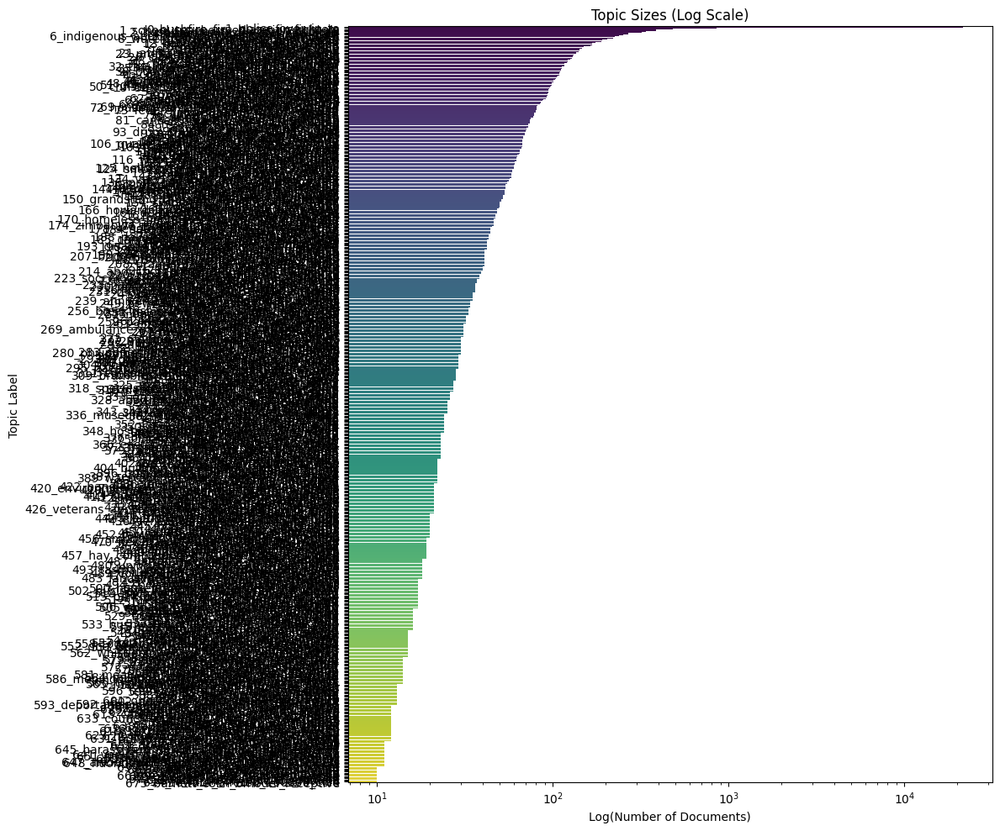

In [11]:
topic_counts = topic_info.set_index("Name")["Count"]
topic_counts = topic_counts.sort_values(ascending=False)

plt.figure(figsize=(12, 10))
sns.barplot(x=topic_counts.values, y=topic_counts.index, palette="viridis")
plt.xscale("log")  # Apply log scale to x-axis
plt.title("Topic Sizes (Log Scale)")
plt.xlabel("Log(Number of Documents)")
plt.ylabel("Topic Label")
plt.tight_layout()
plt.show()


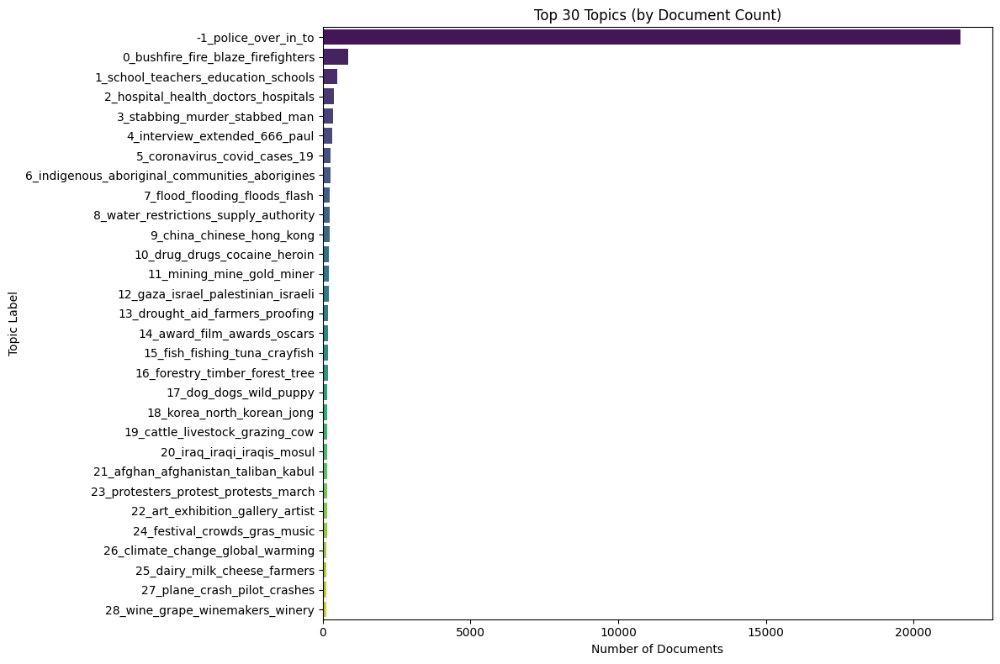

In [12]:
top_n = 30
topic_counts = topic_info.set_index("Name")["Count"]
topic_counts = topic_counts.sort_values(ascending=False).head(top_n)

plt.figure(figsize=(12, 8))
sns.barplot(x=topic_counts.values, y=topic_counts.index, palette="viridis")
plt.title(f"Top {top_n} Topics (by Document Count)")
plt.xlabel("Number of Documents")
plt.ylabel("Topic Label")
plt.tight_layout()
plt.show()


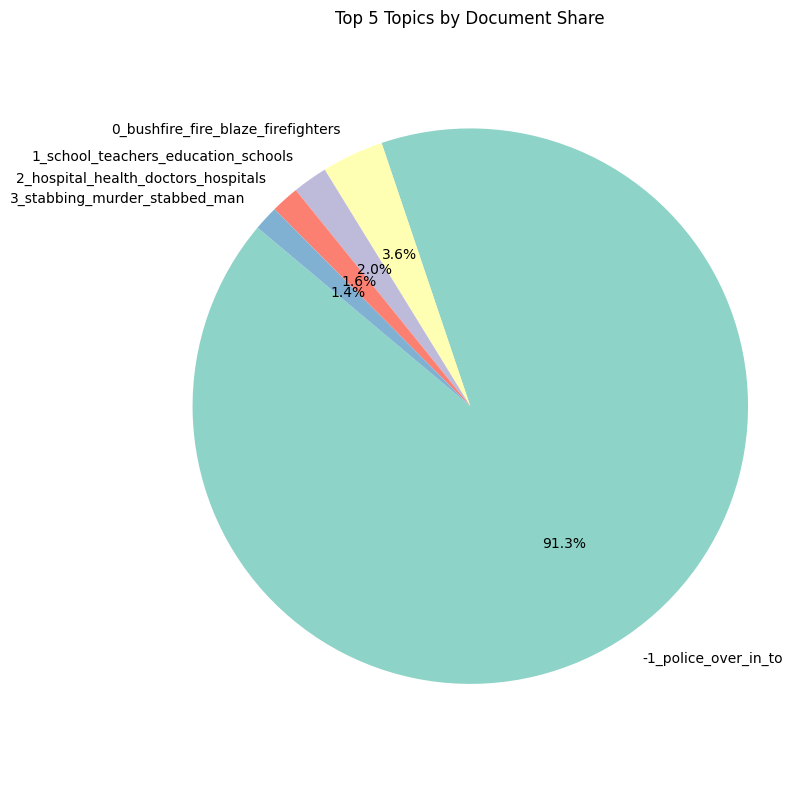

In [21]:
import matplotlib.pyplot as plt
import seaborn as sns

# Prepare data
topic_counts = topic_info.set_index("Name")["Count"]
topic_counts = topic_counts.sort_values(ascending=False)

# Top N topics only
top_n = 5
pie_data = topic_counts[:top_n]

# Use a vibrant color palette
colors = sns.color_palette("Set3", n_colors=top_n)  # You can also try "tab10", "Paired", etc.

# Plot
plt.figure(figsize=(8, 8))
plt.pie(
    pie_data.values,
    labels=pie_data.index,
    autopct='%1.1f%%',
    startangle=140,
    colors=colors
)
plt.title(f"Top {top_n} Topics by Document Share")
plt.axis('equal')  # Equal aspect ratio ensures that pie is drawn as a circle
plt.tight_layout()
plt.show()


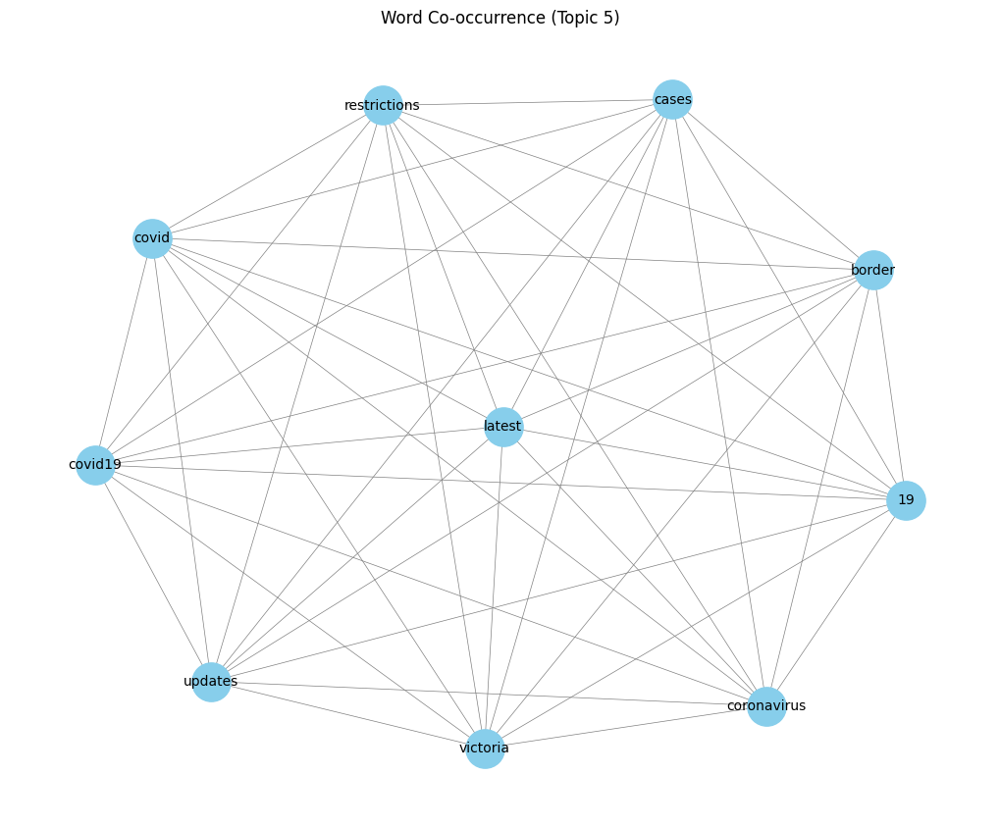

In [10]:
import networkx as nx
from sklearn.feature_extraction.text import CountVectorizer

# Choose a topic (e.g., Topic 5)
topic_num = 5
words = [word[0] for word in topic_model.get_topic(topic_num)]  # Top N words

# Create co-occurrence matrix
vectorizer = CountVectorizer()
X = vectorizer.fit_transform([" ".join(words)])
cooc = (X.T @ X).toarray()

# Build graph
G = nx.Graph()
for i, word in enumerate(vectorizer.get_feature_names_out()):
    for j, other_word in enumerate(vectorizer.get_feature_names_out()):
        if i < j and cooc[i, j] > 0:
            G.add_edge(word, other_word, weight=cooc[i, j])

# Plot
plt.figure(figsize=(10, 8))
pos = nx.spring_layout(G, k=0.3)
nx.draw(G, pos, with_labels=True,
        node_size=800, node_color="skyblue",
        edge_color="gray", width=0.5, font_size=10)
plt.title(f"Word Co-occurrence (Topic {topic_num})")
plt.show()

In [13]:
topic_model.visualize_hierarchy(top_n_topics=12)

In [ ]:
topic_model.visualize_heatmap()

In [14]:
topic_model.visualize_barchart(top_n_topics=12)

In [ ]:
topic_model.visualize_topics()

In [15]:
similar_topics, similarity = topic_model.find_topics("priest", top_n = 3)
similar_topics

[240, 215, 567]

In [16]:
most_similar = similar_topics[0]
print("Most Similar Topic Info: \n{}".format(topic_model.get_topic(most_similar)))
print("Similarity Score: {}".format(similarity[0]))

Most Similar Topic Info: 
[('bishop', np.float64(0.2832367963520182)), ('julie', np.float64(0.11702685115762802)), ('anglican', np.float64(0.08264233997533978)), ('bishops', np.float64(0.05666757318682196)), ('archbishop', np.float64(0.02992585388735384)), ('female', np.float64(0.02978636038324671)), ('church', np.float64(0.025629625215222565)), ('anglicans', np.float64(0.02432261462224646)), ('consecrated', np.float64(0.02432261462224646)), ('investigat', np.float64(0.02432261462224646))]
Similarity Score: 0.467389315366745
